# Spiral like dataset for two classes

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [13]:
# Parameters
n = 200
K = 4

# Generate data
records = []
for j in range(1, K + 1):
    r = np.linspace(0.05, 1, n)
    e = np.random.normal(scale=0.3, size=n)
    t = np.linspace((j - 1) * 4.7, j * 4.7, n) + e
    x1_vals = r * np.sin(t)
    x2_vals = r * np.cos(t)
    records.extend(list(zip(x1_vals, x2_vals)))
df = pd.DataFrame(records, columns=['x1', 'x2'])

# Create labels
y = np.repeat([0, 1, 0, 1], n)
df['y'] = y

print(df.shape)
df


(800, 3)


,x1,x2,y
0,-0.003843,0.049852,0
1,0.012657,0.053291,0
2,0.010213,0.058665,0
3,-0.005558,0.064081,0
4,0.013547,0.067754,0
...,...,...,...
795,-0.149934,0.969378,1
796,-0.244860,0.954780,1
797,0.082230,0.987033,1
798,-0.001082,0.995226,1


In [14]:
y.sum()

400

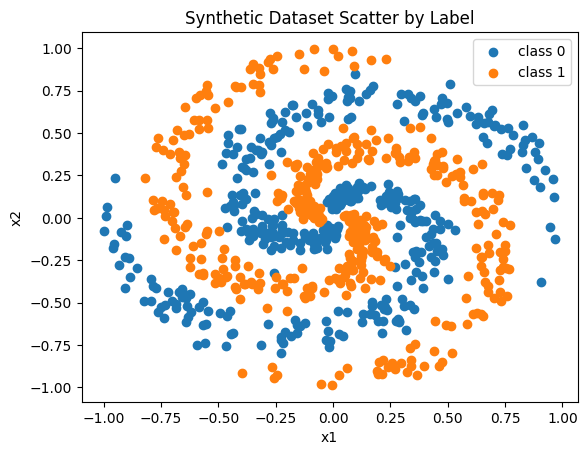

In [15]:
# Plot the dataset
plt.figure()
for lbl in [0, 1]:
    subset = df[df['y'] == lbl]
    plt.scatter(subset['x1'], subset['x2'], label=f'class {lbl}')
plt.xlabel('x1')
plt.ylabel('x2')
plt.legend()
plt.title('Synthetic Dataset Scatter by Label')
plt.show()

In [16]:
# Split intro training and testing
X = df[['x1','x2']].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## LogitBoost $J$ classes

In [2]:
import numpy as np
import pandas as pd
from scipy.special import expit   # the sigmoid function
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import matplotlib as mpl
import logitboost_j_implementation as logitboost
import calibration_functions as calibration
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss
import lmt_final_implementation as lmt
from sklearn import tree

In [13]:
# Fit the LogitBoost model
learners1, J1 = logitboost.logitboost_fit(X_train, y_train, n_estimators=500)

# Predict using the fitted model on test set
y_pred1 = logitboost.logitboost_predict(X_test, learners1, J1)
y_proba1 = logitboost.logitboost_predict_proba(X_test, learners1, J1)

# Evaluate the model
acc1 = accuracy_score(y_test, y_pred1)
roc1 = roc_auc_score(y_test, y_proba1[:, 1])
log_loss1 = log_loss(y_test, y_proba1)

# Print results for original make_circles
print(f"Log-loss on original make_circles: {log_loss1:.4f}")
print(f"Accuracy on original make_circles: {acc1:.4f}")
print(f"ROC AUC on original make_circles: {roc1:.4f}")

Log-loss on original make_circles: 0.6962
Accuracy on original make_circles: 0.5083
ROC AUC on original make_circles: 0.4740


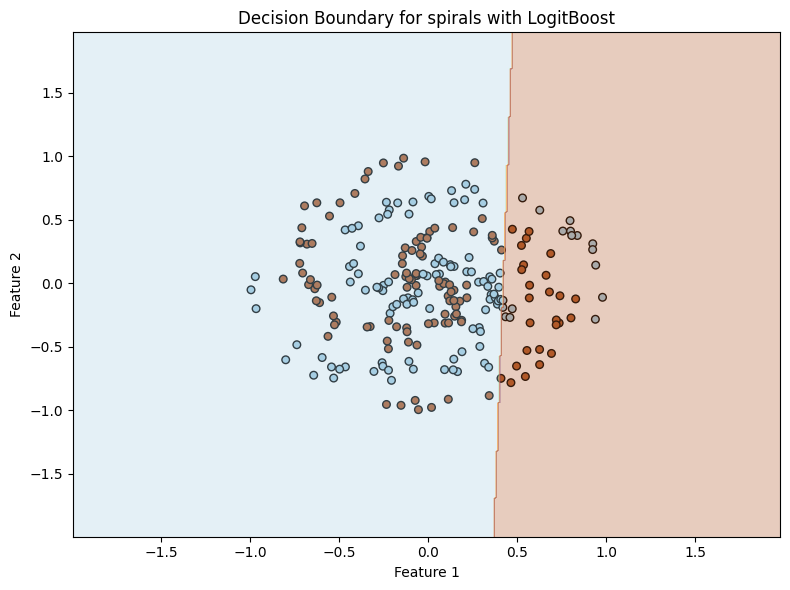

In [14]:
logitboost.plot_decision_boundary(X_test, y_test, learners1, J1,
                       title="Decision Boundary for spirals with LogitBoost")

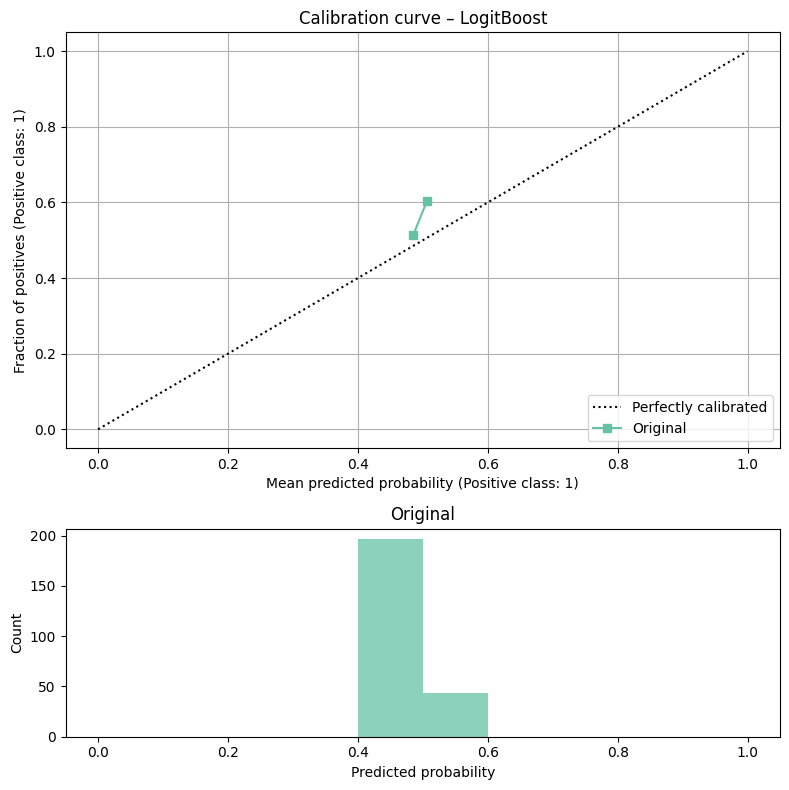

In [ ]:
from sklearn.calibration import CalibrationDisplay
from matplotlib.gridspec import GridSpec

# --- 2) calibration curves (10 bins) ------------------------
# Get class-probability estimates for each model
#  -> keep only the probability of the positive class (column 1)
proba_orig = logitboost.logitboost_predict_proba(X_test, learners1, J1)[:, 1]

fig = plt.figure(figsize=(8, 8))
gs  = GridSpec(nrows=2, ncols=2, height_ratios=[2, 1])

ax_curve = fig.add_subplot(gs[0, :])                 # big panel for the curves
ax_hist1 = fig.add_subplot(gs[1, :])                 # histogram – model 1
colors   = plt.get_cmap("Set2")

# ―― Curve for the ORIGINAL data ――
CalibrationDisplay.from_predictions(
    y_test,           # true labels (binary, 0 / 1)
    proba_orig,       # predicted prob of class 1
    n_bins=10,
    name="Original",
    ax=ax_curve,
    color=colors(0),
)


ax_curve.set_title("Calibration curve – LogitBoost")
ax_curve.grid(True)
ax_hist1.hist(proba_orig, bins=10, range=(0, 1),
              color=colors(0), alpha=0.75)
ax_hist1.set(title="Original", xlabel="Predicted probability", ylabel="Count")

fig.tight_layout()
plt.show()


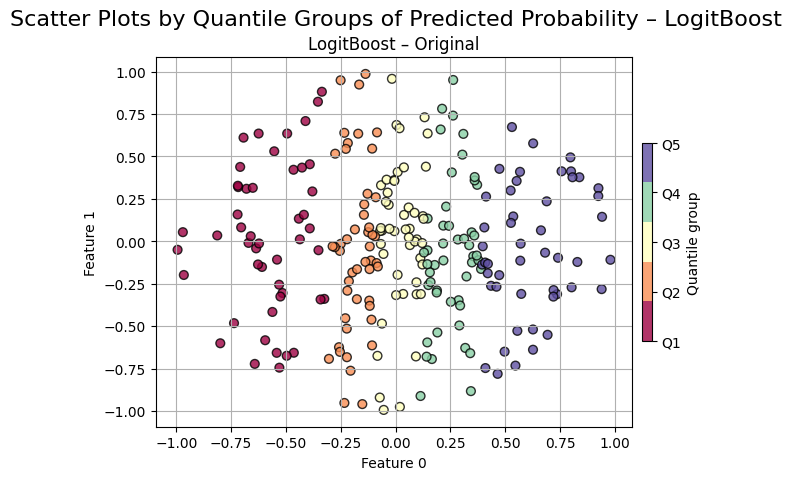

In [16]:
# Get the probabilities of the positive class
y_proba1 = logitboost.logitboost_predict_proba(X_test, learners1, J1)[:, 1]

calibration.plot_scatter_by_quantile(
    X_test,
    y_proba1,
    n_quantiles=5,
    title="LogitBoost – Original",
    cmap="Spectral"
)

# Fetch the fig & axes that were just used
fig = plt.gcf()
axes = plt.gca()

# Now add the colorbar against those axes
cbar = fig.colorbar(
    mappable=axes.collections[0],      # use the first PathCollection
    ax=axes,
    orientation="vertical",
    fraction=0.02,
    pad=0.02
)
cbar.set_label("Quantile group")
cbar.set_ticks(range(5))
cbar.set_ticklabels([f"Q{i+1}" for i in range(5)])

fig.suptitle(
    "Scatter Plots by Quantile Groups of Predicted Probability – LogitBoost", 
    fontsize=16
)
plt.show()

## Decision Trees $C4.5$

Shallow Tree (No Pruning) - Accuracy: 0.5708, AUC: 0.6246, Log Loss: 0.6598
Regular Tree (No Pruning) - Accuracy: 0.9375, AUC: 0.9664, Log Loss: 0.8500
Overfit Tree (No Pruning) - Accuracy: 0.9542, AUC: 0.9538, Log Loss: 1.6520
Regular Tree (With Pruning) - Accuracy: 0.9375, AUC: 0.9645, Log Loss: 0.8506


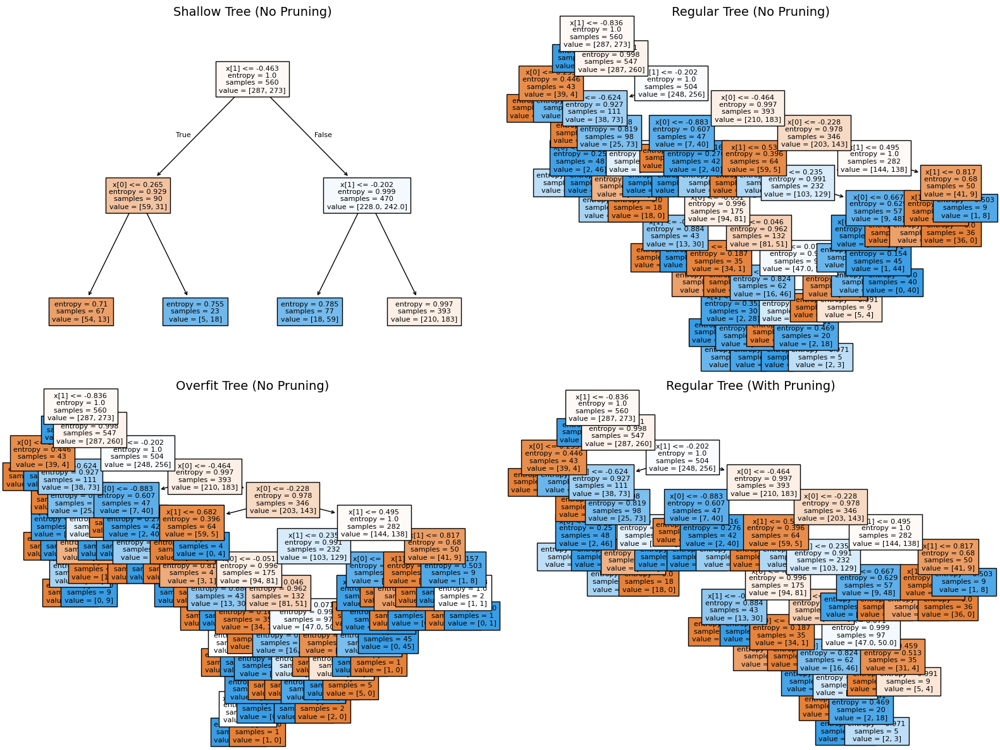

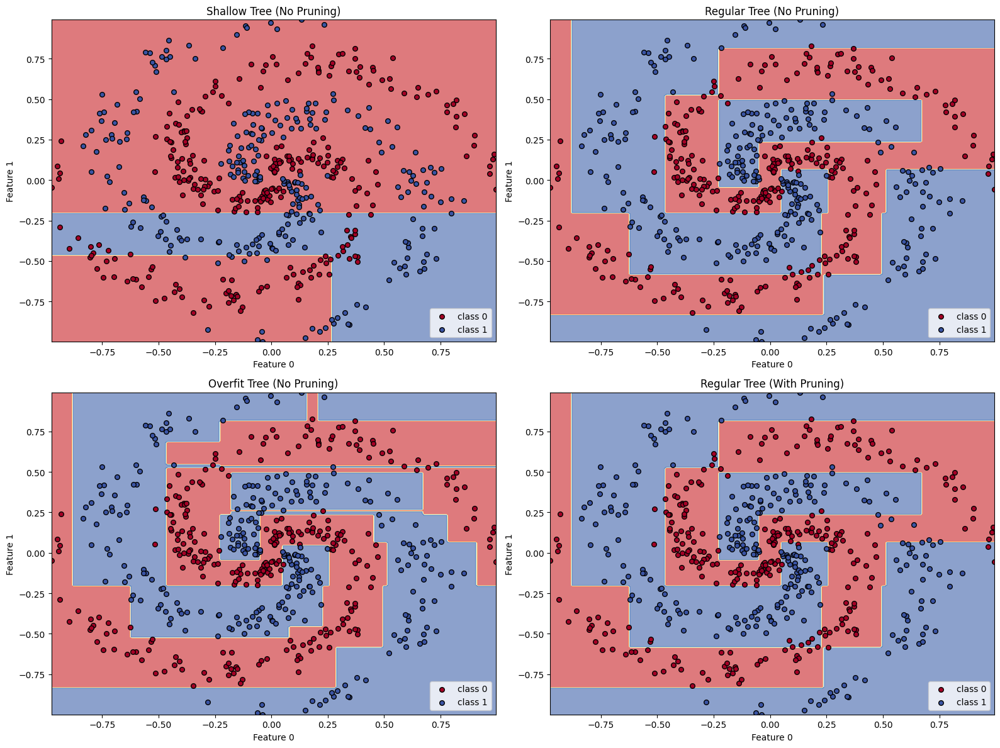

In [17]:
lmt.compare_tree_variants(X_train, X_test, y_train, y_test, lmt, decision=True)

In [18]:
clf_shallow     = lmt.construct_tree(X_train,     y_train,     size='shallow', pruning=False)
clf_regular     = lmt.construct_tree(X_train,     y_train,     size='regular', pruning=False)
clf_overfit     = lmt.construct_tree(X_train,     y_train,     size='overfit', pruning=False)
clf_pruned      = lmt.construct_tree(X_train,     y_train,     size='regular', pruning=True)

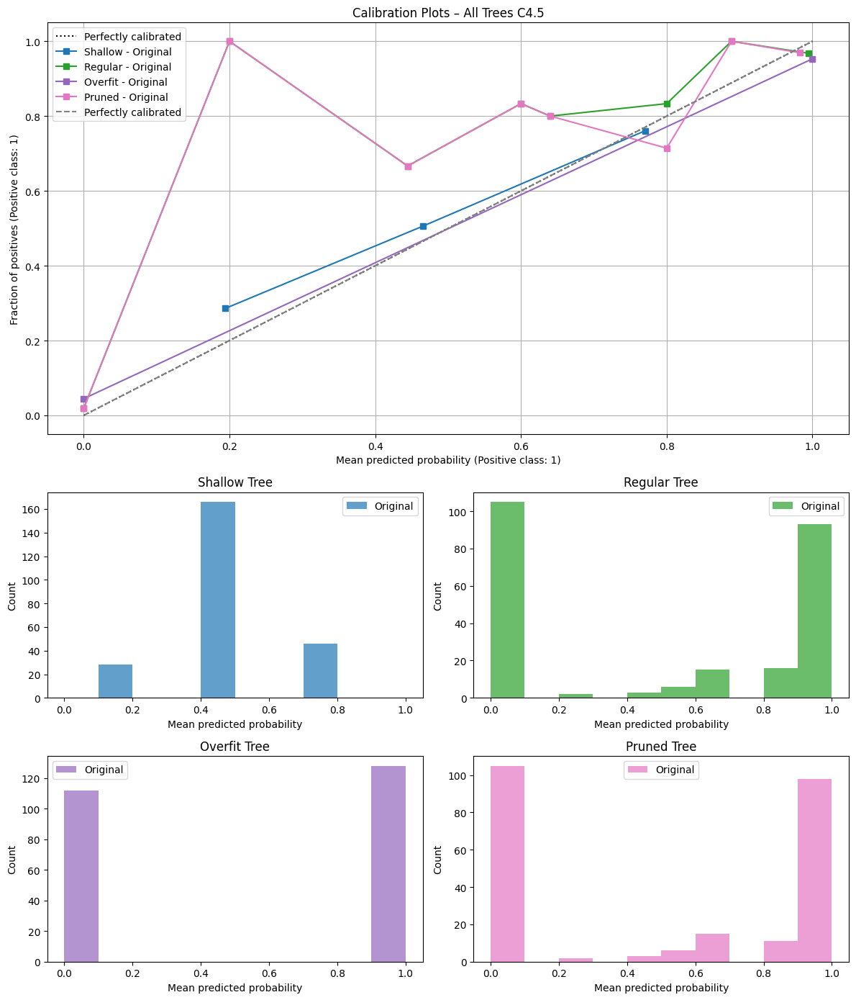

In [19]:
clf_orig_list = [clf_shallow, clf_regular, clf_overfit, clf_pruned]
n_bins = 10
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig = plt.figure(figsize=(12, 14))
gs = GridSpec(3, 2, figure=fig, height_ratios=[3, 1.5, 1.5])

# Axes
ax_curve = fig.add_subplot(gs[0, :])
hist_axes = [fig.add_subplot(gs[i, j]) for i in [1, 2] for j in [0, 1]]

colors = plt.get_cmap("tab10")

# Plot all calibration curves in the same axis
for idx, clf_orig in enumerate(clf_orig_list):
    proba_orig = clf_orig.predict_proba(X_test)[:, 1]
    CalibrationDisplay.from_predictions(
        y_test, proba_orig, n_bins=n_bins,
        name=f"{model_labels[idx]} - Original",
        ax=ax_curve, color=colors(2*idx)
    )


ax_curve.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly calibrated')
ax_curve.set_title("Calibration Plots – All Trees C4.5")
ax_curve.set_xlabel("Mean predicted probability (Positive class: 1)")
ax_curve.set_ylabel("Fraction of positives (Positive class: 1)")
ax_curve.legend(loc='best')
ax_curve.grid(True)

# Plot individual histograms
for idx, clf_orig in enumerate(clf_orig_list):
    ax = hist_axes[idx]
    proba_orig = clf_orig.predict_proba(X_test)[:, 1]

    ax.hist(proba_orig, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(2*idx), label='Original')
    ax.set_title(f"{model_labels[idx]} Tree")
    ax.set_xlabel("Mean predicted probability")
    ax.set_ylabel("Count")
    ax.legend()

fig.tight_layout()
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_13152\3784466939.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


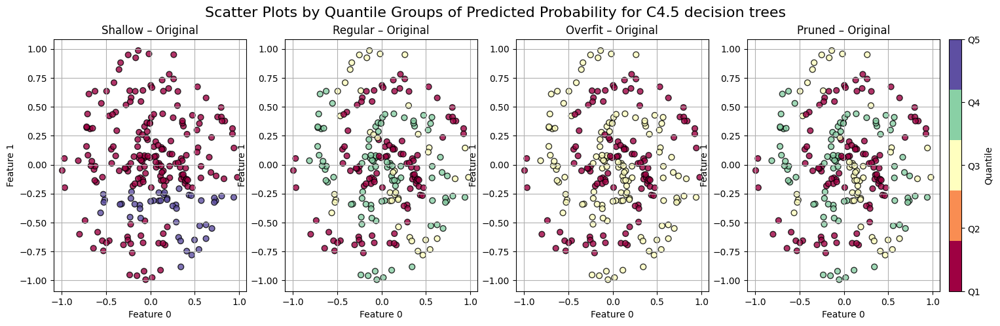

In [20]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 5))  # e.g. wider and shorter

# Top row: original (predict on X_test[:,:2])
for idx, clf in enumerate([clf_shallow, clf_regular, clf_overfit, clf_pruned]):
    y_proba = clf.predict_proba(X_test)[:, 1]
    X_vis   = X_test
    ax = axes[idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )


# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for C4.5 decision trees", fontsize=16)
plt.show()

## LMT Version 1

Shallow Tree (No Pruning) → Accuracy: 0.5333, AUC: 0.5517, Log Loss: 0.6580
Regular Tree (No Pruning) → Accuracy: 0.8417, AUC: 0.8978, Log Loss: 1.4046
Overfit Tree (No Pruning) → Accuracy: 0.8708, AUC: 0.9444, Log Loss: 1.4142
Regular Tree (With Pruning) → Accuracy: 0.7250, AUC: 0.7964, Log Loss: 1.3517


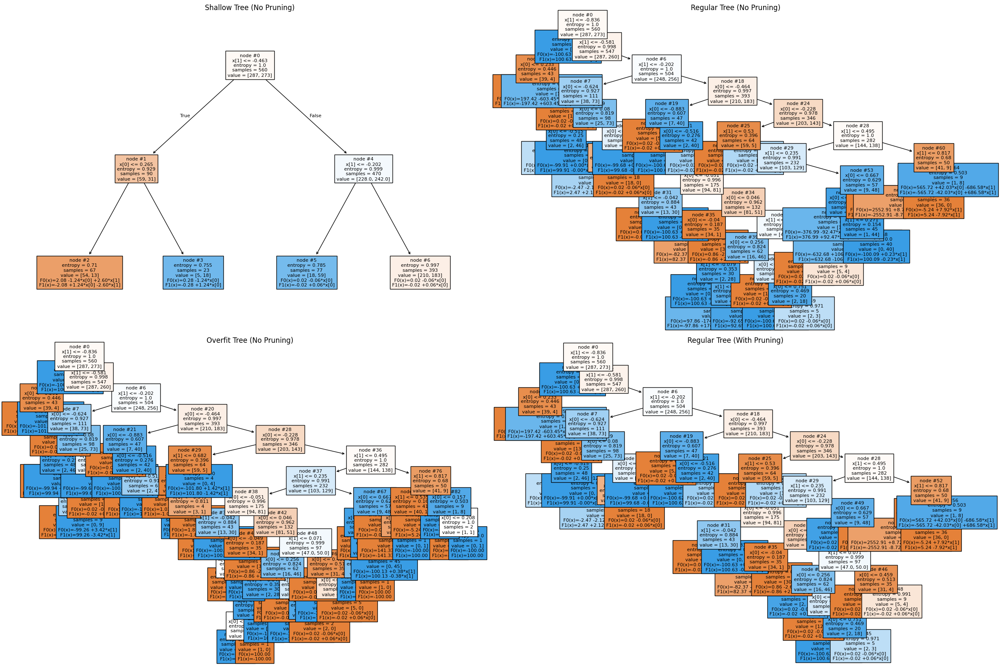

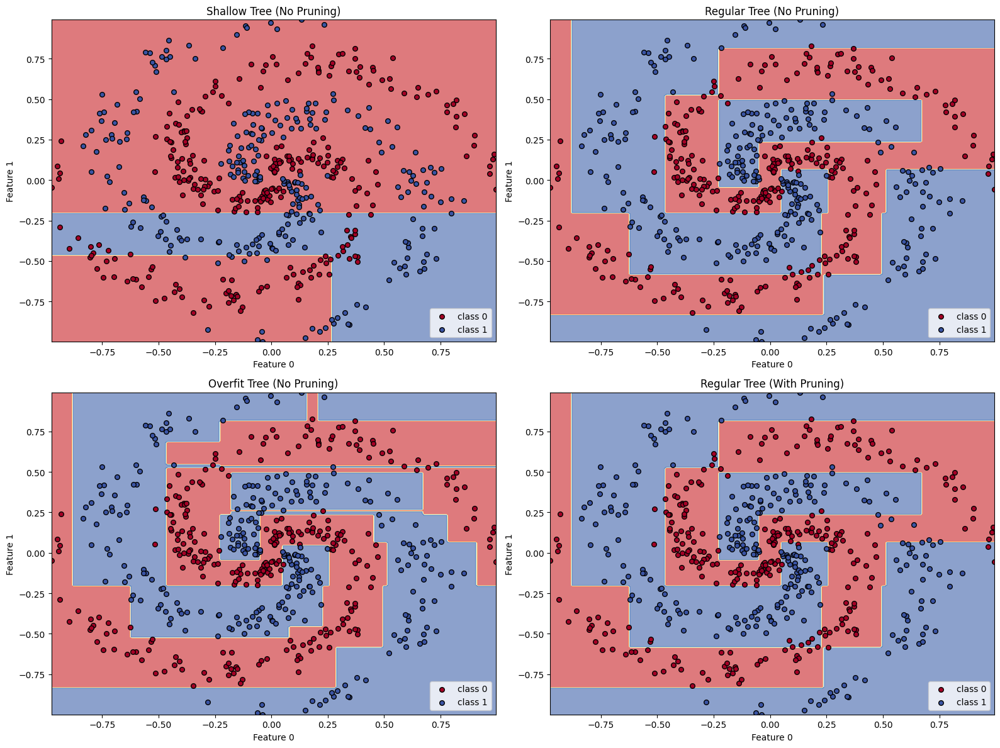

In [22]:
lmt.compare_lmt_variants(X_train, X_test, y_train, y_test, lmt, decision=True)

In [23]:
clf_shallow, nodes_shallow     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular, nodes_regular     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit, nodes_overfit     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned, nodes_pruned      = lmt.fit_logistic_model_tree(X_train,     y_train,     size='regular', pruning=True)
print('pruned (original) done')

shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done


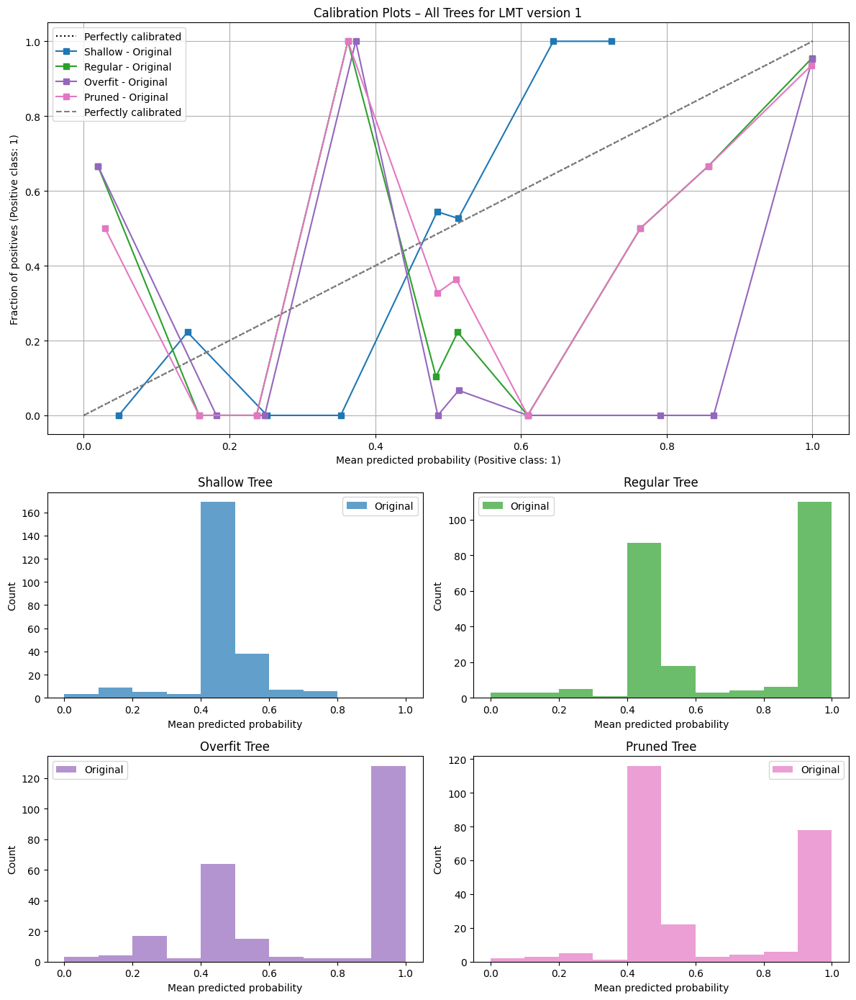

In [24]:
clfs = [clf_shallow, clf_regular, clf_overfit, clf_pruned]
nodes = [nodes_shallow, nodes_regular, nodes_overfit, nodes_pruned]
n_bins = 10
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig = plt.figure(figsize=(12, 14))
gs = GridSpec(3, 2, figure=fig, height_ratios=[3, 1.5, 1.5])

# Calibration curve plot (top row, spans both columns)
ax_curve = fig.add_subplot(gs[0, :])
hist_axes = [fig.add_subplot(gs[i, j]) for i in [1, 2] for j in [0, 1]]

colors = plt.get_cmap("tab10")

# Plot all calibration curves in a single axis
for idx, (clf, node_model) in enumerate(zip(clfs, nodes)):
    proba_orig = lmt.predict_proba_lmt(X_test, clf, node_model)

    CalibrationDisplay.from_predictions(
        y_test, proba_orig, n_bins=n_bins,
        name=f"{model_labels[idx]} - Original",
        ax=ax_curve, color=colors(2 * idx)
    )

ax_curve.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly calibrated')
ax_curve.set_title("Calibration Plots – All Trees for LMT version 1")
ax_curve.set_xlabel("Mean predicted probability (Positive class: 1)")
ax_curve.set_ylabel("Fraction of positives (Positive class: 1)")
ax_curve.legend(loc='best')
ax_curve.grid(True)

# Plot individual histograms
for idx, (clf, node_model) in enumerate(zip(clfs, nodes)):
    ax = hist_axes[idx]
    proba_orig = lmt.predict_proba_lmt(X_test, clf, node_model)

    ax.hist(proba_orig, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(2 * idx), label="Original")
    ax.set_title(f"{model_labels[idx]} Tree")
    ax.set_xlabel("Mean predicted probability")
    ax.set_ylabel("Count")
    ax.legend()

fig.tight_layout()
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_13152\1290770945.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


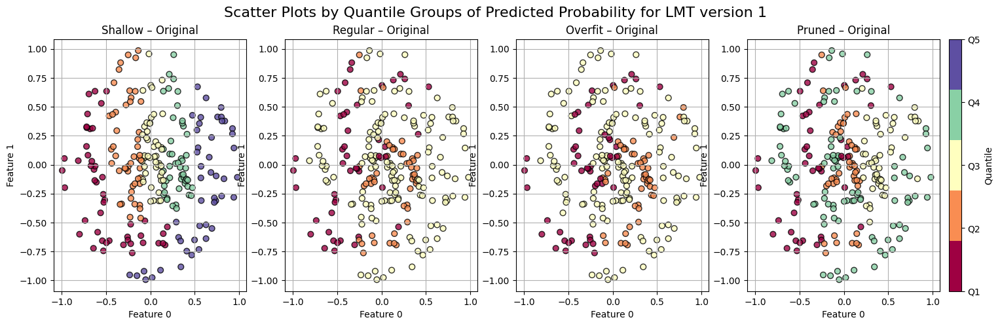

In [32]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 5))

for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow, clf_regular, clf_overfit, clf_pruned],
    [nodes_shallow, nodes_regular, nodes_overfit, nodes_pruned]
)):
    y_proba = lmt.predict_proba_lmt(X_test, clf, node_model)
    X_vis   = X_test
    ax = axes[idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )


# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for LMT version 1", fontsize=16)
plt.show()

## LMT version 2

Shallow Tree (No Pruning) → Accuracy: 0.5750, AUC: 0.6718, Log Loss: 0.6506
Regular Tree (No Pruning) → Accuracy: 0.9167, AUC: 0.9329, Log Loss: 0.4724
Overfit Tree (No Pruning) → Accuracy: 0.9250, AUC: 0.9131, Log Loss: 0.6527
Regular Tree (With Pruning) → Accuracy: 0.9250, AUC: 0.9344, Log Loss: 0.4602


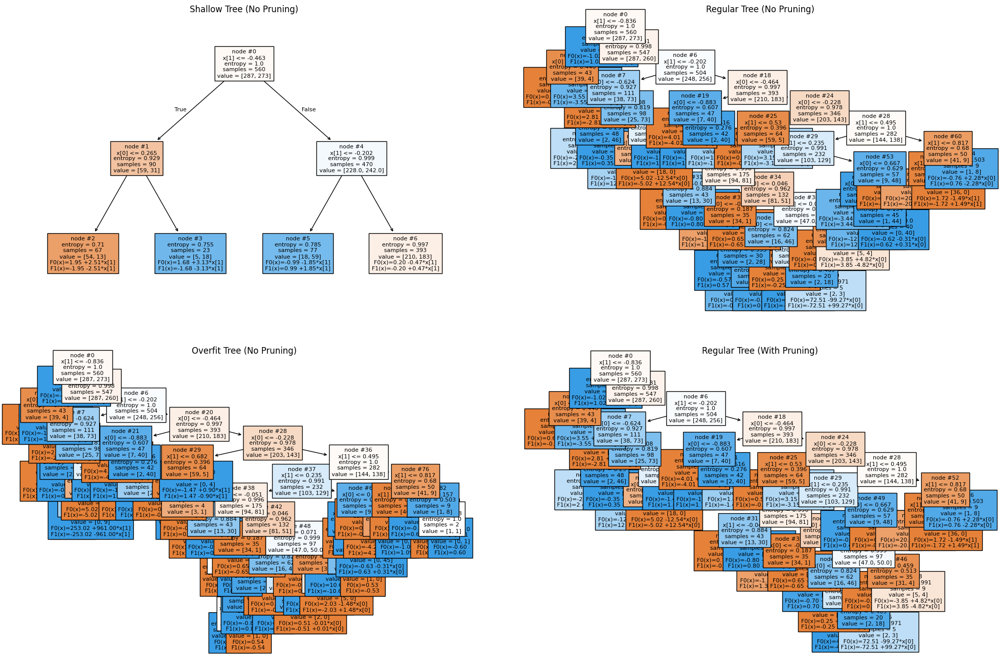

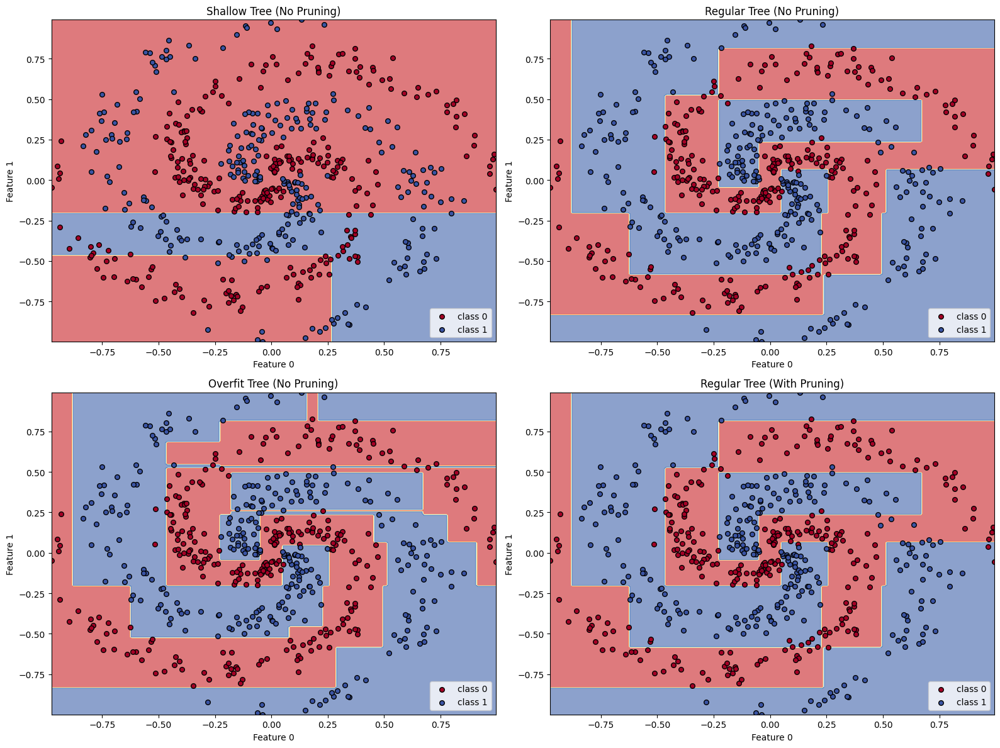

In [25]:
lmt.compare_lmt_variants_v2(X_train, X_test, y_train, y_test, lmt, decision=True)

In [17]:
clf_shallow2, nodes_shallow2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular2, nodes_regular2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit2, nodes_overfit2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned2, nodes_pruned2      = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='regular', pruning=True)
print('pruned (original) done')

shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done


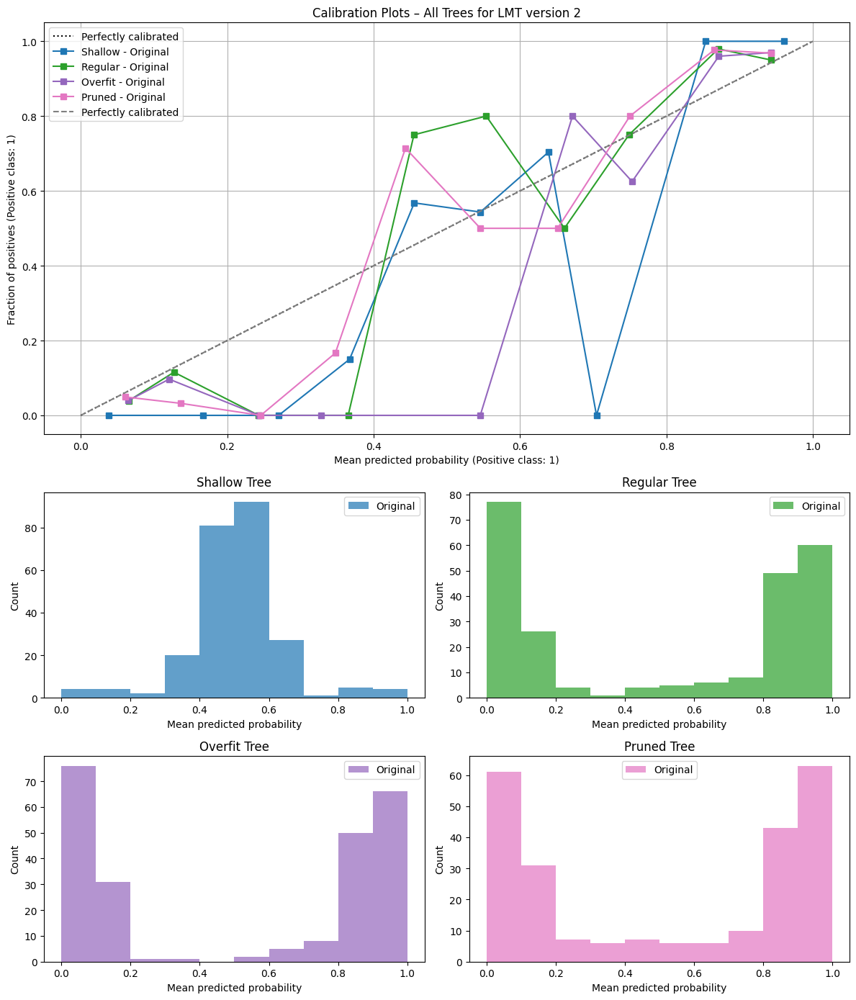

In [18]:
clfs = [clf_shallow2, clf_regular2, clf_overfit2, clf_pruned2]
nodes = [nodes_shallow2, nodes_regular2, nodes_overfit2, nodes_pruned2]
n_bins = 10
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig = plt.figure(figsize=(12, 14))
gs = GridSpec(3, 2, figure=fig, height_ratios=[3, 1.5, 1.5])

# Calibration curve plot (top row, spans both columns)
ax_curve = fig.add_subplot(gs[0, :])
hist_axes = [fig.add_subplot(gs[i, j]) for i in [1, 2] for j in [0, 1]]

colors = plt.get_cmap("tab10")

# Plot all calibration curves in a single axis
for idx, (clf, node_model) in enumerate(zip(clfs, nodes)):
    proba_orig = lmt.predict_proba_lmt(X_test, clf, node_model)

    CalibrationDisplay.from_predictions(
        y_test, proba_orig, n_bins=n_bins,
        name=f"{model_labels[idx]} - Original",
        ax=ax_curve, color=colors(2 * idx)
    )

ax_curve.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly calibrated')
ax_curve.set_title("Calibration Plots – All Trees for LMT version 2")
ax_curve.set_xlabel("Mean predicted probability (Positive class: 1)")
ax_curve.set_ylabel("Fraction of positives (Positive class: 1)")
ax_curve.legend(loc='best')
ax_curve.grid(True)

# Plot individual histograms
for idx, (clf, node_model) in enumerate(zip(clfs, nodes)):
    ax = hist_axes[idx]
    proba_orig = lmt.predict_proba_lmt(X_test, clf, node_model)

    ax.hist(proba_orig, bins=n_bins, range=(0, 1), alpha=0.7, color=colors(2 * idx), label="Original")
    ax.set_title(f"{model_labels[idx]} Tree")
    ax.set_xlabel("Mean predicted probability")
    ax.set_ylabel("Count")
    ax.legend()

fig.tight_layout()
plt.show()

C:\Users\allis\AppData\Local\Temp\ipykernel_13152\1957939428.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))


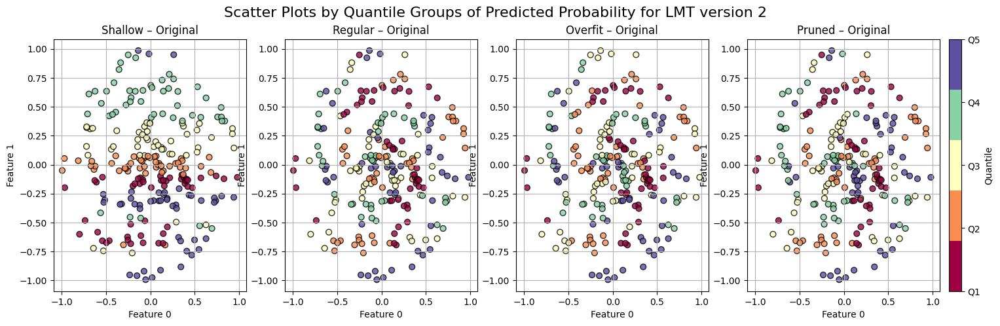

In [33]:
nq = 5
norm = mpl.colors.Normalize(vmin=0, vmax=nq-1)
cmap_name = 'Spectral'
model_labels = ["Shallow", "Regular", "Overfit", "Pruned"]

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 5))

# Top row: original (predict on X_test[:,:2])
for idx, (clf, node_model) in enumerate(zip(
    [clf_shallow2, clf_regular2, clf_overfit2, clf_pruned2],
    [nodes_shallow2, nodes_regular2, nodes_overfit2, nodes_pruned2]
)):
    y_proba = lmt.predict_proba_lmt(X_test, clf, node_model)
    X_vis   = X_test
    ax = axes[idx]
    sc = calibration.plot_scatter_by_quantile(
        X_vis, y_proba,
        n_quantiles=nq,
        title=f"{model_labels[idx]} – Original",
        ax=ax,
        feature_1=0,
        feature_2=1,
        cmap=cmap_name,
        norm=norm
    )


# one shared colorbar via an “empty” ScalarMappable
sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name, nq))
sm.set_array([])  # no data needed

cbar = fig.colorbar(
    sm,
    ax=axes,
    orientation='vertical',
    fraction=0.02,
    pad=0.01
)
cbar.set_label("Quantile")
cbar.set_ticks(np.arange(nq))
cbar.set_ticklabels([f"Q{i+1}" for i in range(nq)])

fig.suptitle("Scatter Plots by Quantile Groups of Predicted Probability for LMT version 2", fontsize=16)
plt.show()

# Spiral like dataset for three classes

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
import numpy as np
import pandas as pd
from scipy.special import expit   # the sigmoid function
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import matplotlib as mpl
import logitboost_j_implementation as logitboost
import calibration_functions as calibration
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss
import lmt_final_implementation as lmt
from sklearn import tree

In [3]:
from sklearn.calibration import CalibrationDisplay
from matplotlib.gridspec import GridSpec

In [4]:
# Parameters
n = 200        # points per spiral arm
K = 3          # number of arms / classes   <-- now 3 instead of 4

# Generate data
records = []
labels  = []
for j in range(K):
    r = np.linspace(0.05, 1, n)                       # radius
    e = np.random.normal(scale=0.3, size=n)           # noise
    t = np.linspace(j * 4.7, (j + 1) * 4.7, n) + e    # angle
    x1_vals = r * np.sin(t)
    x2_vals = r * np.cos(t)

    records.extend(zip(x1_vals, x2_vals))
    labels.extend([j] * n)        # label 0, 1, 2 → three colors

# Build DataFrame
df = pd.DataFrame(records, columns=['x1', 'x2'])
df['y'] = labels

print(df.shape)     # (600, 3)
df.head()


(600, 3)


,x1,x2,y
0,0.005105,0.049739,0
1,0.018962,0.051387,0
2,-0.005630,0.059281,0
3,-0.005415,0.064093,0
4,0.026844,0.063668,0


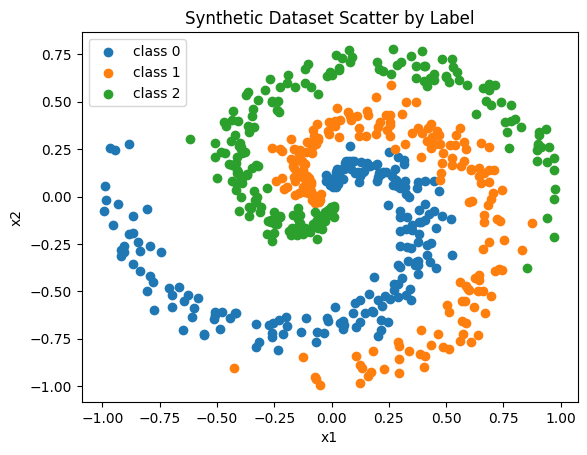

In [5]:
# Plot the dataset
plt.figure()
for lbl in [0, 1, 2]:
    subset = df[df['y'] == lbl]
    plt.scatter(subset['x1'], subset['x2'], label=f'class {lbl}')
plt.xlabel('x1')
plt.ylabel('x2')
plt.legend()
plt.title('Synthetic Dataset Scatter by Label')
plt.show()

In [6]:
# Split intro training and testing
X = df[['x1','x2']].to_numpy()
y = df['y'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## LogitBoost $J$ classes

In [7]:
# Fit the LogitBoost model
learners1, J1 = logitboost.logitboost_fit(X_train, y_train, n_estimators=500)

# Predict using the fitted model on test set
y_pred1 = logitboost.logitboost_predict(X_test, learners1, J1)
y_proba1 = logitboost.logitboost_predict_proba(X_test, learners1, J1)

# Evaluate the model
acc1 = accuracy_score(y_test, y_pred1)
log_loss1 = log_loss(y_test, y_proba1)

# Print results for original 
print(f"Log-loss on original spirals: {log_loss1:.4f}")
print(f"Accuracy on original spirals: {acc1:.4f}")

Log-loss on original spirals: 0.9901
Accuracy on original spirals: 0.3722


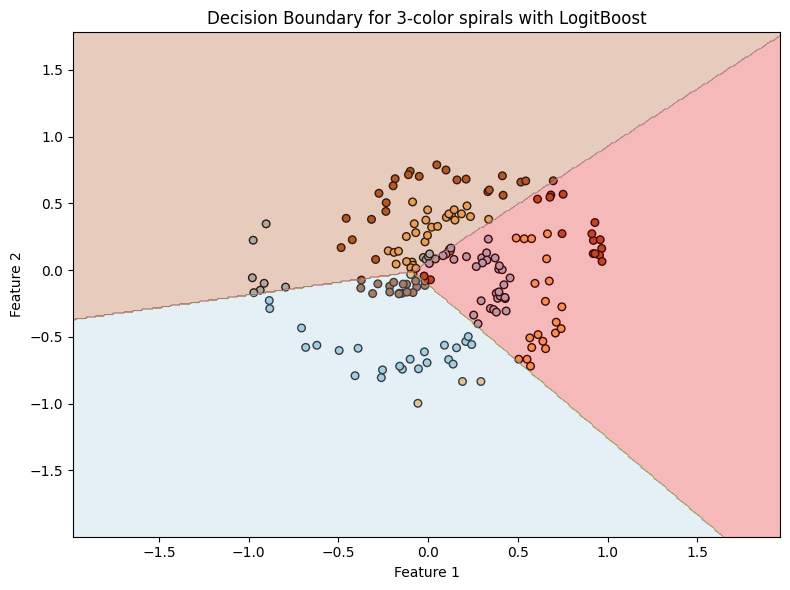

In [8]:
logitboost.plot_decision_boundary(X_test, y_test, learners1, J1,
                       title="Decision Boundary for 3-color spirals with LogitBoost")

C:\Users\allis\AppData\Local\Temp\ipykernel_16852\2448044253.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


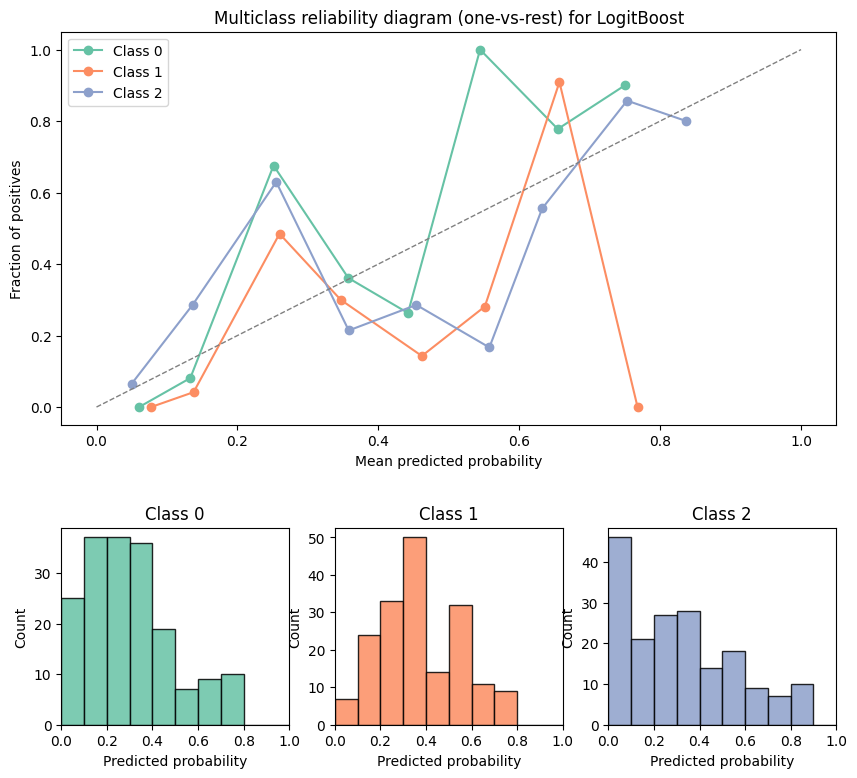

In [9]:
from sklearn.metrics import brier_score_loss

proba = logitboost.logitboost_predict_proba(X_test, learners1, J1)

# -- colours ----------------------------------------------------------
cmap   = plt.get_cmap("Set2")
colors = [cmap(i) for i in range(3)]        # 0,1,2

# -- figure & grid ----------------------------------------------------
fig = plt.figure(figsize=(10, 9))
gs  = GridSpec(2, 3, height_ratios=[2, 1], hspace=0.35)

ax_cal = fig.add_subplot(gs[0, :])          # big calibration plot

# -- reliability diagram (one-vs-rest for each class) -----------------
n_bins = 10
for k in range(3):
    y_bin        = (y_test == k).astype(int)       # one-vs-rest targets
    prob_k       = proba[:, k]                     # predicted P(y==k)
    frac_pos, mp = calibration_curve(y_bin, prob_k, n_bins=n_bins)

    ax_cal.plot(mp, frac_pos, marker='o', color=colors[k],
                label=f"Class {k}")

# perfect calibration diagonal
ax_cal.plot([0, 1], [0, 1], "--", color="gray", lw=1)
ax_cal.set_xlabel("Mean predicted probability")
ax_cal.set_ylabel("Fraction of positives")
ax_cal.set_title("Multiclass reliability diagram (one-vs-rest) for LogitBoost")
ax_cal.legend(loc="best")

# -- histograms underneath --------------------------------------------
for k in range(3):
    ax_hist = fig.add_subplot(gs[1, k])
    ax_hist.hist(proba[:, k],
                 bins=n_bins, range=(0, 1),
                 color=colors[k], alpha=0.85, edgecolor="black")
    ax_hist.set_title(f"Class {k}")
    ax_hist.set_xlabel("Predicted probability")
    ax_hist.set_ylabel("Count")
    ax_hist.set_xlim(0, 1)

plt.tight_layout()
plt.show()


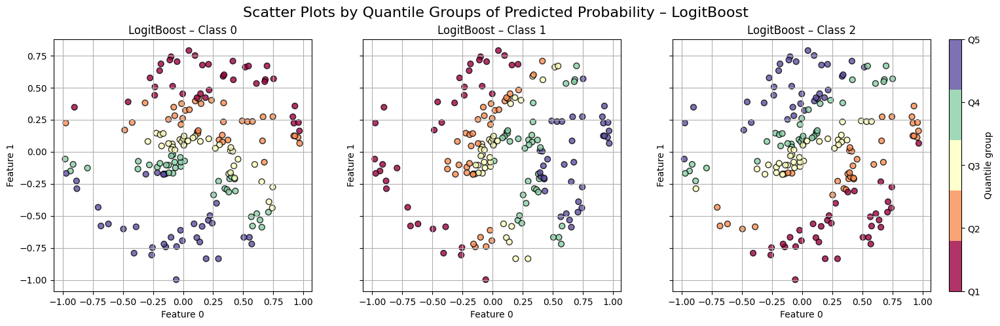

In [10]:
# 1) get the full probability matrix (n_samples, 3)
probas = logitboost.logitboost_predict_proba(X_test, learners1, J1)

# 2) prepare 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=True)

# 3) for each class index, call your quantile‐scatter on its own Axes
for idx, ax in enumerate(axes):
    proba = probas[:,idx]
    sc = calibration.plot_scatter_by_quantile(
        X_test,
        proba,
        n_quantiles=5,
        title=f"LogitBoost – Class {idx}",
        ax=ax,
        cmap="Spectral"
    )

# 4) add one colorbar for all three plots
cbar = fig.colorbar(
    mappable=sc,                 # last PathCollection from the loop
    ax=axes.tolist(),            # attach to all subplots
    orientation="vertical",
    fraction=0.02,
    pad=0.02,
    ticks=range(5)
)
cbar.set_label("Quantile group")
cbar.set_ticklabels([f"Q{i+1}" for i in range(5)])

# 5) super‐title and layout
fig.suptitle(
    "Scatter Plots by Quantile Groups of Predicted Probability – LogitBoost", 
    fontsize=16
)
plt.show()


## Decision Trees $C4.5$

Shallow Tree (No Pruning) - Accuracy: 0.7000, Log Loss: 1.5015
Regular Tree (No Pruning) - Accuracy: 0.9556, Log Loss: 1.4265
Overfit Tree (No Pruning) - Accuracy: 0.9556, Log Loss: 1.6019
Regular Tree (With Pruning) - Accuracy: 0.9556, Log Loss: 1.4274


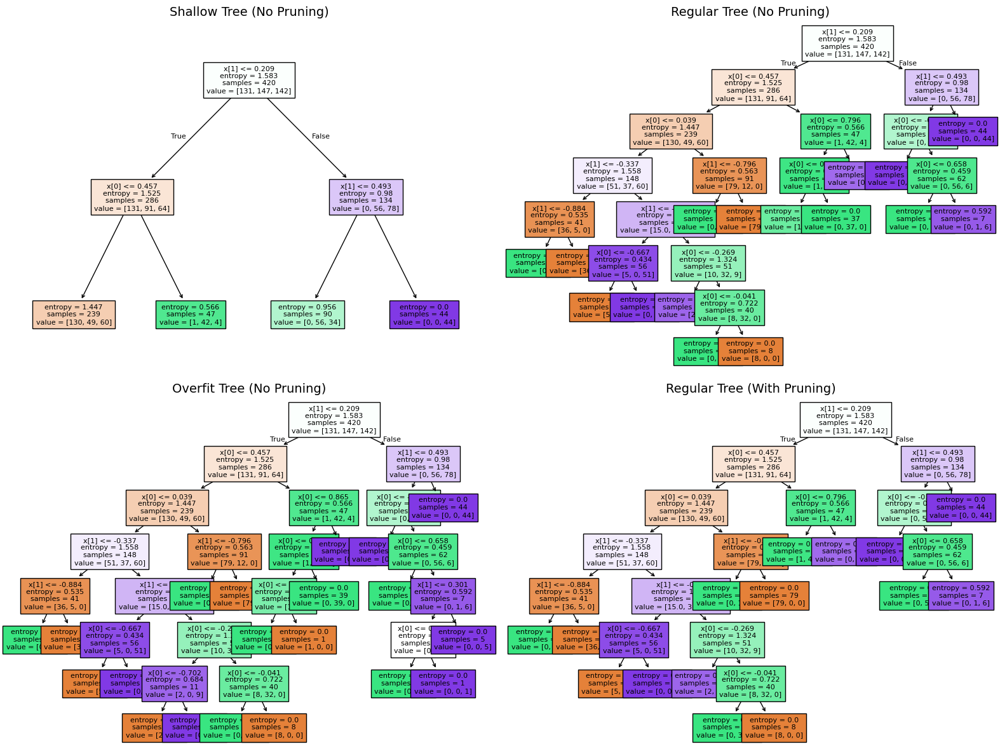

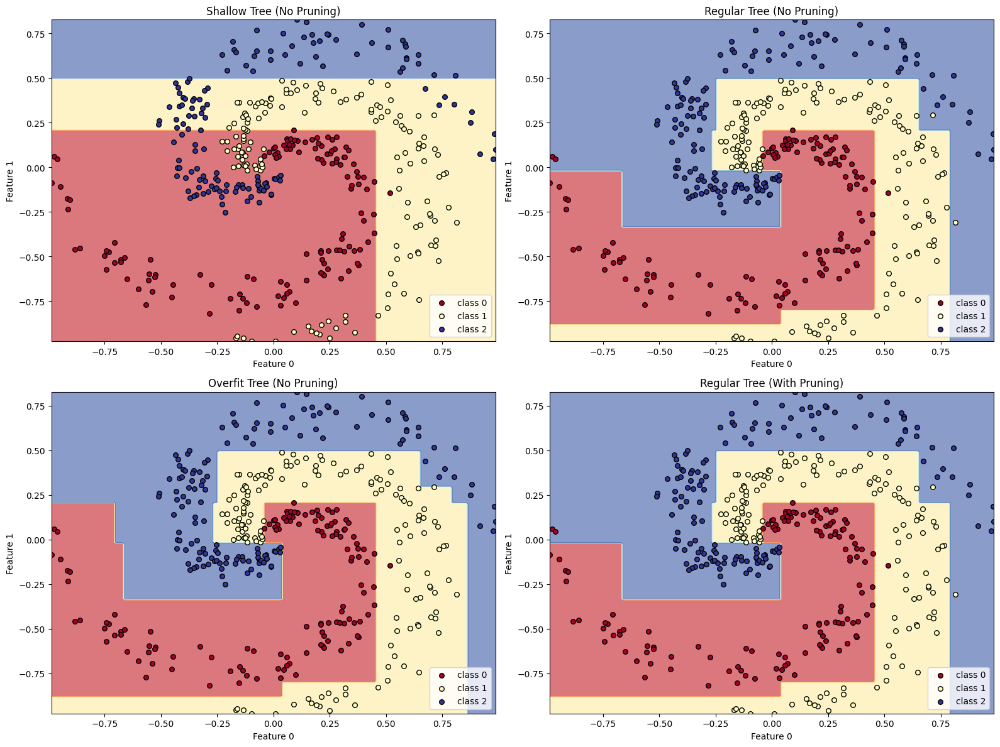

In [11]:
lmt.compare_tree_variants_multiclass(X_train, X_test, y_train, y_test, lmt, decision=True)

In [12]:
clf_shallow     = lmt.construct_tree(X_train,     y_train,     size='shallow', pruning=False)
clf_regular     = lmt.construct_tree(X_train,     y_train,     size='regular', pruning=False)
clf_overfit     = lmt.construct_tree(X_train,     y_train,     size='overfit', pruning=False)
clf_pruned      = lmt.construct_tree(X_train,     y_train,     size='regular', pruning=True)

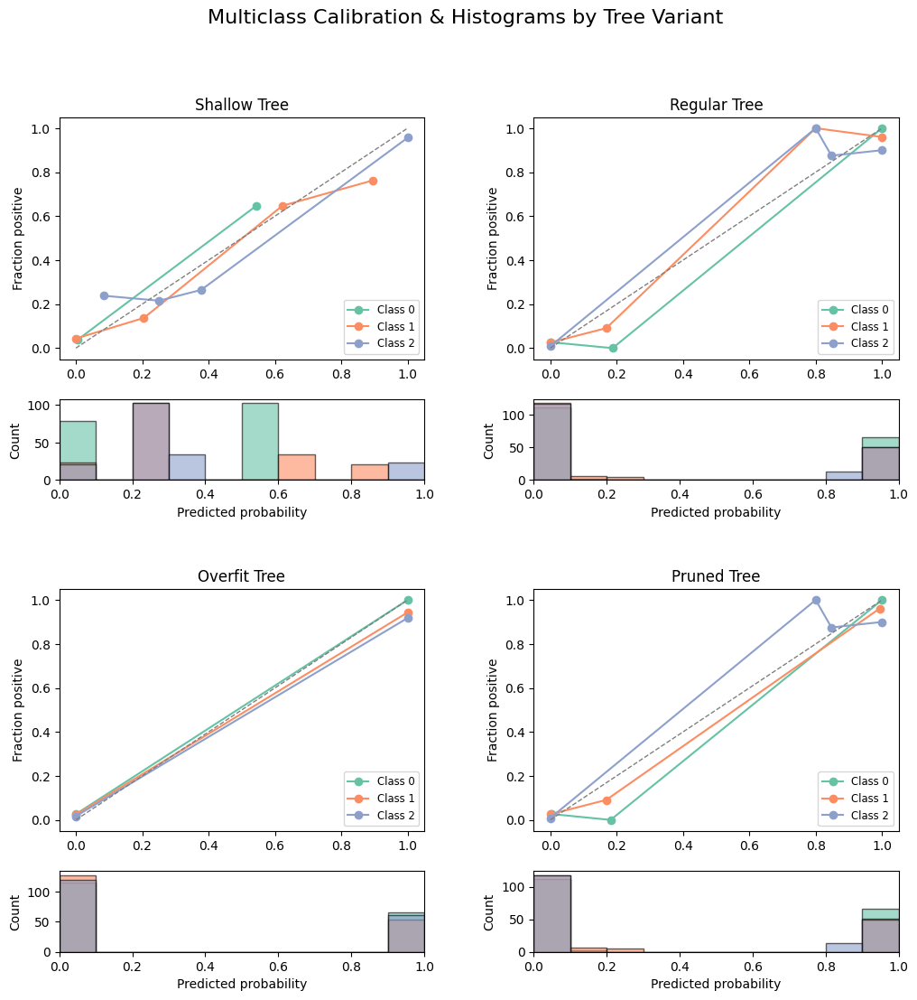

In [13]:
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

clfs = [
    (clf_shallow, "Shallow"),
    (clf_regular, "Regular"),
    (clf_overfit, "Overfit"),
    (clf_pruned,  "Pruned")
]

# get colors for the 3 classes
cmap   = plt.get_cmap("Set2")
colors = [cmap(i) for i in range(3)]

n_bins = 10

fig = plt.figure(figsize=(12,12))
outer = GridSpec(2, 2, wspace=0.3, hspace=0.3)

for idx, (clf, label) in enumerate(clfs):
    # compute probabilities for this tree
    proba = clf.predict_proba(X_test)   # shape = (n_samples, 3)

    # location in 2x2 grid
    row, col = divmod(idx, 2)
    cell = GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[row, col],
                                   height_ratios=[3,1], hspace=0.25)

    # --- Top: reliability diagram ---
    ax_cal = fig.add_subplot(cell[0])
    for k in range(3):
        y_bin  = (y_test == k).astype(int)
        p_k    = proba[:, k]
        frac, mean_pred = calibration_curve(y_bin, p_k, n_bins=n_bins)
        ax_cal.plot(mean_pred, frac, marker='o', color=colors[k],
                    label=f"Class {k}")
    ax_cal.plot([0,1],[0,1],"--", color="gray", lw=1)
    ax_cal.set_title(f"{label} Tree")
    ax_cal.set_ylabel("Fraction positive")
    ax_cal.legend(loc="lower right", fontsize="small")

    # --- Bottom: histograms of predicted probas ---
    ax_hist = fig.add_subplot(cell[1])
    for k in range(3):
        ax_hist.hist(proba[:, k],
                     bins=n_bins, range=(0,1),
                     color=colors[k], alpha=0.6, edgecolor="black")
    ax_hist.set_xlabel("Predicted probability")
    ax_hist.set_ylabel("Count")
    ax_hist.set_xlim(0,1)

# super‐title
fig.suptitle("Multiclass Calibration & Histograms by Tree Variant", fontsize=16)
plt.show()


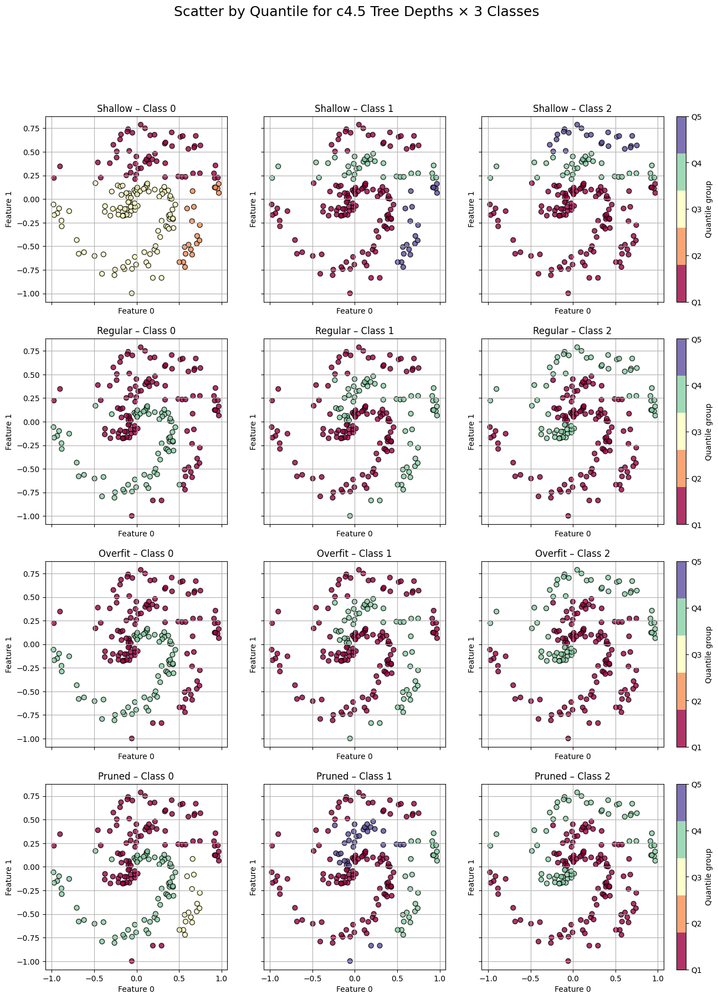

In [14]:
n_rows, n_cols = 4, 3
fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(15, 20),
    sharex=True, sharey=True
)

# 2) Loop over rows (tree depths) and columns (classes)
for i, (clf, depth_label) in enumerate(clfs):
    probas = clf.predict_proba(X_test)  # shape = (n_samples, 3)
    last_sc = None

    for j in range(n_cols):
        ax = axes[i, j]
        proba_j = probas[:, j]

        # draw the scatter and keep the PathCollection
        last_sc = calibration.plot_scatter_by_quantile(
            X_test,
            proba_j,
            n_quantiles=5,
            title=f"{depth_label} – Class {j}",
            ax=ax,
            cmap="Spectral"
        )

    # 3) one colorbar per row, spanning all three columns
    cbar = fig.colorbar(
        last_sc,
        ax=axes[i, :].tolist(),
        orientation="vertical",
        fraction=0.02,
        pad=0.02,
        ticks=range(5)
    )
    cbar.set_label("Quantile group")
    cbar.set_ticklabels([f"Q{k+1}" for k in range(5)])

# 4) Super‐title and layout
fig.suptitle("Scatter by Quantile for c4.5 Tree Depths × 3 Classes", fontsize=18)
plt.show()

## LMT version 1

Shallow Tree (No Pruning) → Accuracy: 0.6556, Log Loss: 0.9055
Regular Tree (No Pruning) → Accuracy: 0.9556, Log Loss: 1.6225
Overfit Tree (No Pruning) → Accuracy: 0.9278, Log Loss: 2.6032
Regular Tree (With Pruning) → Accuracy: 0.9556, Log Loss: 1.6225


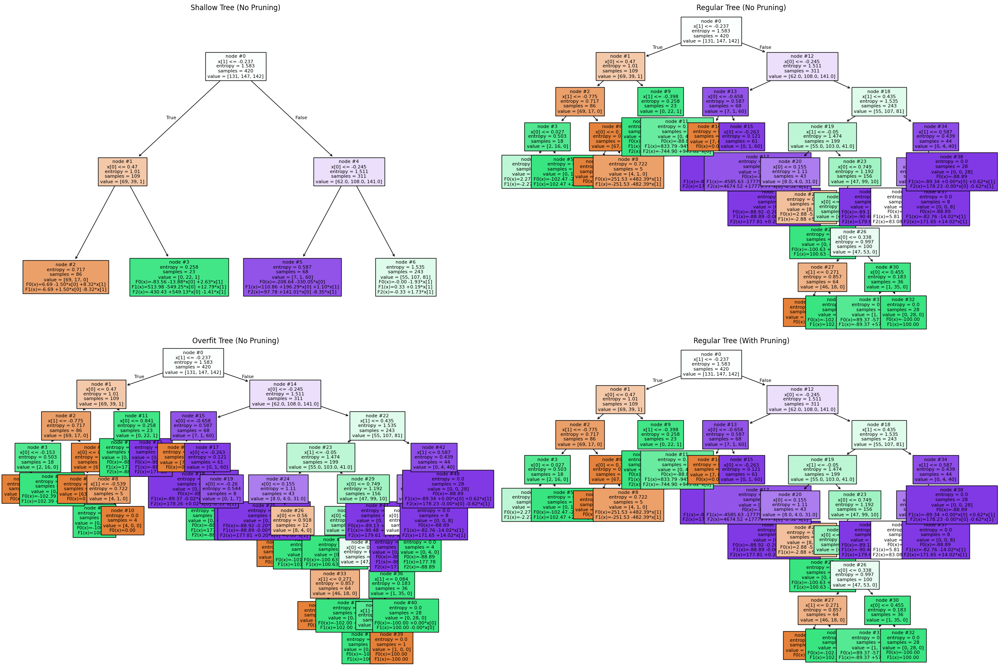

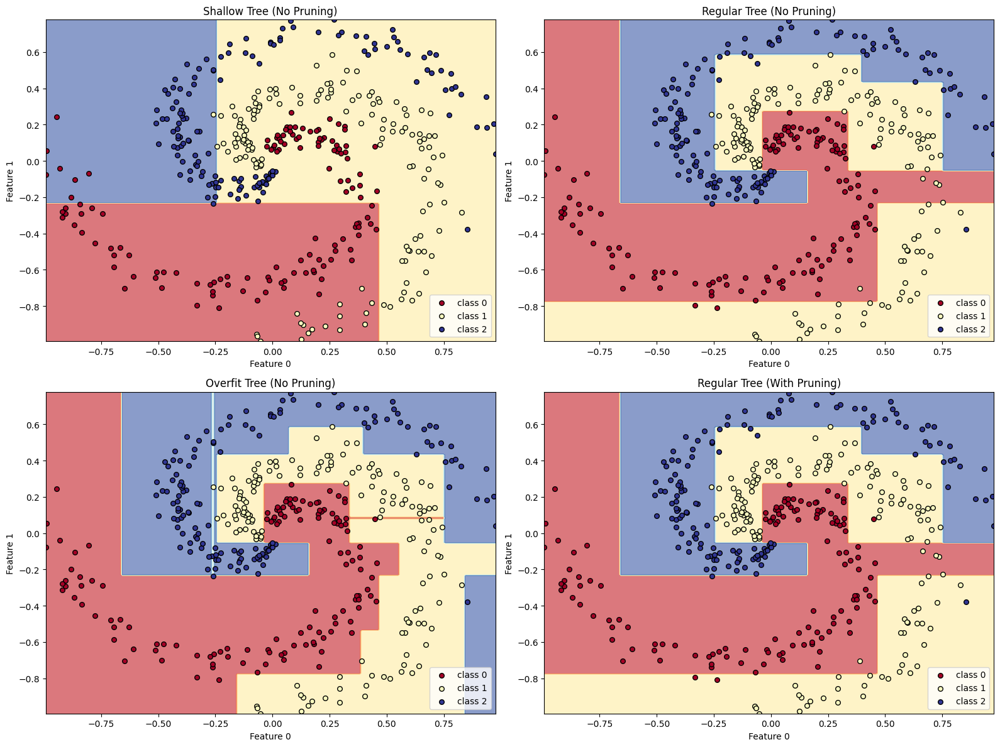

In [7]:
lmt.compare_lmt_variants_multiclass(X_train, X_test, y_train, y_test, lmt, version='v1', decision=True)

In [15]:
clf_shallow, nodes_shallow     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular, nodes_regular     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit, nodes_overfit     = lmt.fit_logistic_model_tree(X_train,     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned, nodes_pruned      = lmt.fit_logistic_model_tree(X_train,     y_train,     size='regular', pruning=True)
print('pruned (original) done')

shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done


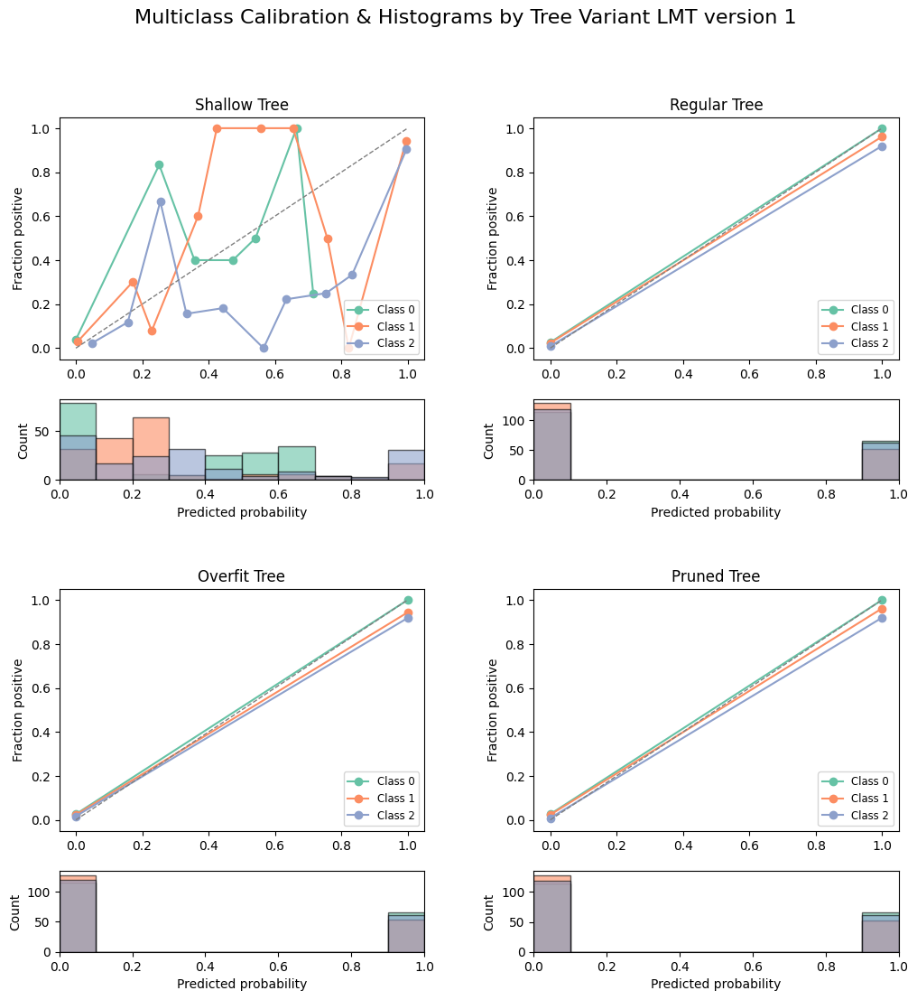

In [16]:
clfs = [
    (clf_shallow, nodes_shallow, "Shallow"),
    (clf_regular, nodes_regular, "Regular"),
    (clf_overfit, nodes_overfit,  "Overfit"),
    (clf_pruned,  nodes_pruned, "Pruned")
]

# get colors for the 3 classes
cmap   = plt.get_cmap("Set2")
colors = [cmap(i) for i in range(3)]

n_bins = 10

fig = plt.figure(figsize=(12,12))
outer = GridSpec(2, 2, wspace=0.3, hspace=0.3)

for idx, (clf, node_model, label) in enumerate(clfs):
    # compute probabilities for this tree
    proba = lmt.predict_proba_lmt_multiclass(X_test, clf, node_model)

    # location in 2x2 grid
    row, col = divmod(idx, 2)
    cell = GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[row, col],
                                   height_ratios=[3,1], hspace=0.25)

    # --- Top: reliability diagram ---
    ax_cal = fig.add_subplot(cell[0])
    for k in range(3):
        y_bin  = (y_test == k).astype(int)
        p_k    = proba[:, k]
        frac, mean_pred = calibration_curve(y_bin, p_k, n_bins=n_bins)
        ax_cal.plot(mean_pred, frac, marker='o', color=colors[k],
                    label=f"Class {k}")
    ax_cal.plot([0,1],[0,1],"--", color="gray", lw=1)
    ax_cal.set_title(f"{label} Tree")
    ax_cal.set_ylabel("Fraction positive")
    ax_cal.legend(loc="lower right", fontsize="small")

    # --- Bottom: histograms of predicted probas ---
    ax_hist = fig.add_subplot(cell[1])
    for k in range(3):
        ax_hist.hist(proba[:, k],
                     bins=n_bins, range=(0,1),
                     color=colors[k], alpha=0.6, edgecolor="black")
    ax_hist.set_xlabel("Predicted probability")
    ax_hist.set_ylabel("Count")
    ax_hist.set_xlim(0,1)

# super‐title
fig.suptitle("Multiclass Calibration & Histograms by Tree Variant LMT version 1", fontsize=16)
plt.show()

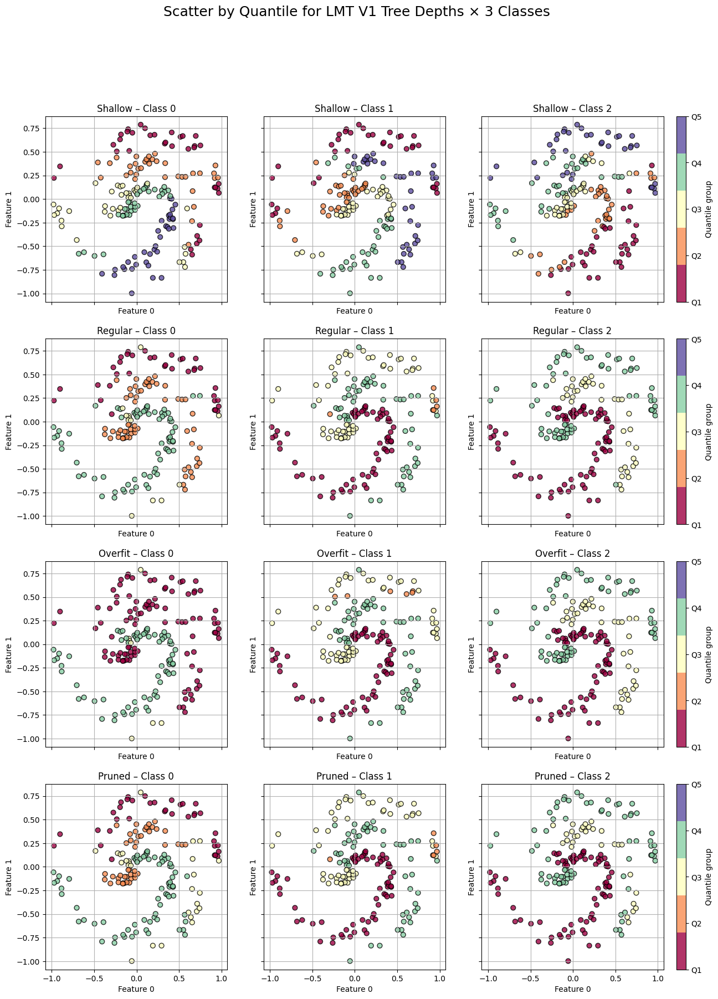

In [19]:
n_rows, n_cols = 4, 3
fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(15, 20),
    sharex=True, sharey=True
)

# 2) Loop over rows (tree depths) and columns (classes)
for i, (clf, node_model, depth_label) in enumerate(clfs):
    probas = lmt.predict_proba_lmt_multiclass(X_test, clf, node_model)  # shape = (n_samples, 3)
    last_sc = None

    for j in range(n_cols):
        ax = axes[i, j]
        proba_j = probas[:, j]

        # draw the scatter and keep the PathCollection
        last_sc = calibration.plot_scatter_by_quantile(
            X_test,
            proba_j,
            n_quantiles=5,
            title=f"{depth_label} – Class {j}",
            ax=ax,
            cmap="Spectral"
        )

    # 3) one colorbar per row, spanning all three columns
    cbar = fig.colorbar(
        last_sc,
        ax=axes[i, :].tolist(),
        orientation="vertical",
        fraction=0.02,
        pad=0.02,
        ticks=range(5)
    )
    cbar.set_label("Quantile group")
    cbar.set_ticklabels([f"Q{k+1}" for k in range(5)])

# 4) Super‐title and layout
fig.suptitle("Scatter by Quantile for LMT V1 Tree Depths × 3 Classes", fontsize=18)
plt.show()

## LMT Version 2

Shallow Tree (No Pruning) → Accuracy: 0.5778, Log Loss: 1.7410
Regular Tree (No Pruning) → Accuracy: 0.9389, Log Loss: 1.2020
Overfit Tree (No Pruning) → Accuracy: 0.9278, Log Loss: 0.6582
Regular Tree (With Pruning) → Accuracy: 0.9389, Log Loss: 1.2020


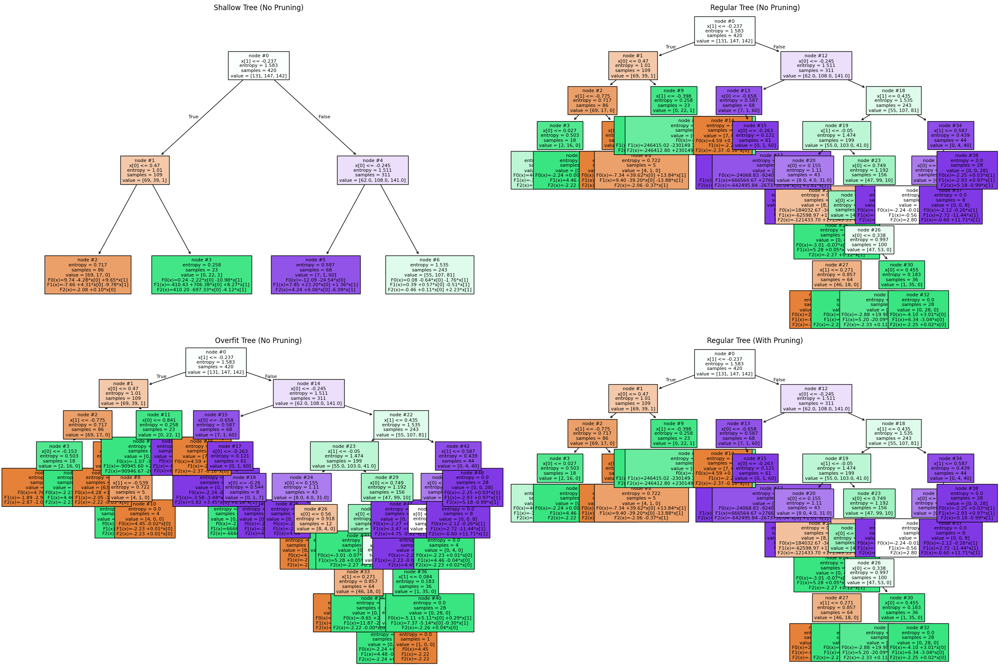

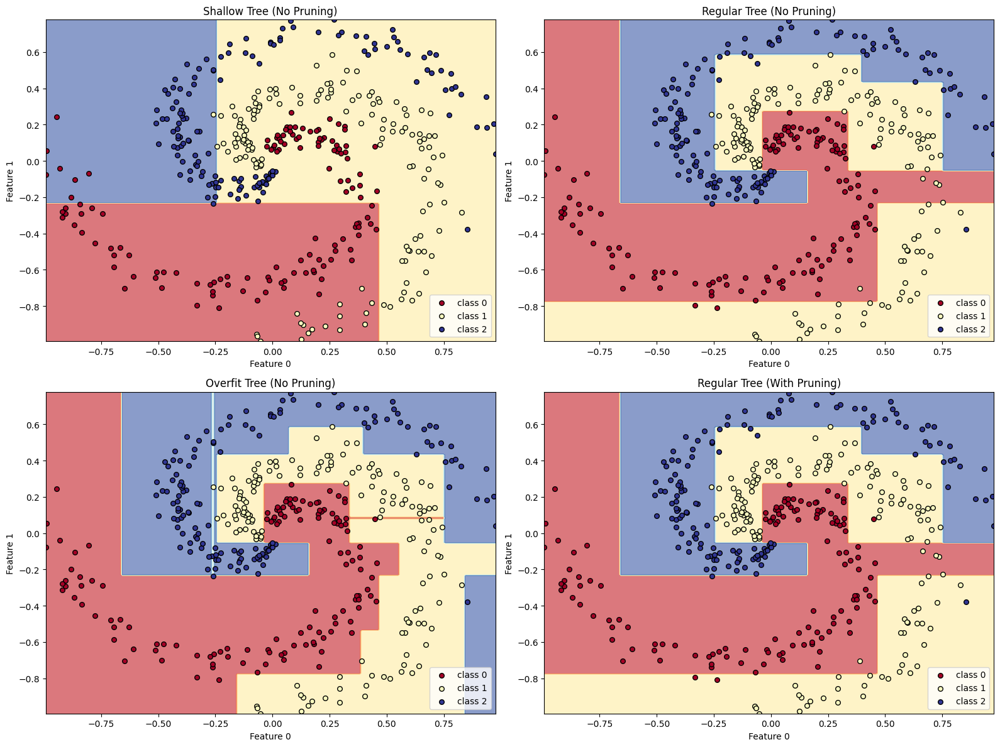

In [8]:
lmt.compare_lmt_variants_multiclass(X_train, X_test, y_train, y_test, lmt, version='v2', decision=True)

In [17]:
clf_shallow2, nodes_shallow2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='shallow', pruning=False)
print('shallow (original) done')
clf_regular2, nodes_regular2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='regular', pruning=False)
print('regular (original) done')
clf_overfit2, nodes_overfit2     = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='overfit', pruning=False)
print('overfit (original) done')
clf_pruned2, nodes_pruned2      = lmt.fit_logistic_model_tree_v2(X_train,     y_train,     size='regular', pruning=True)
print('pruned (original) done')

shallow (original) done
regular (original) done
overfit (original) done
pruned (original) done


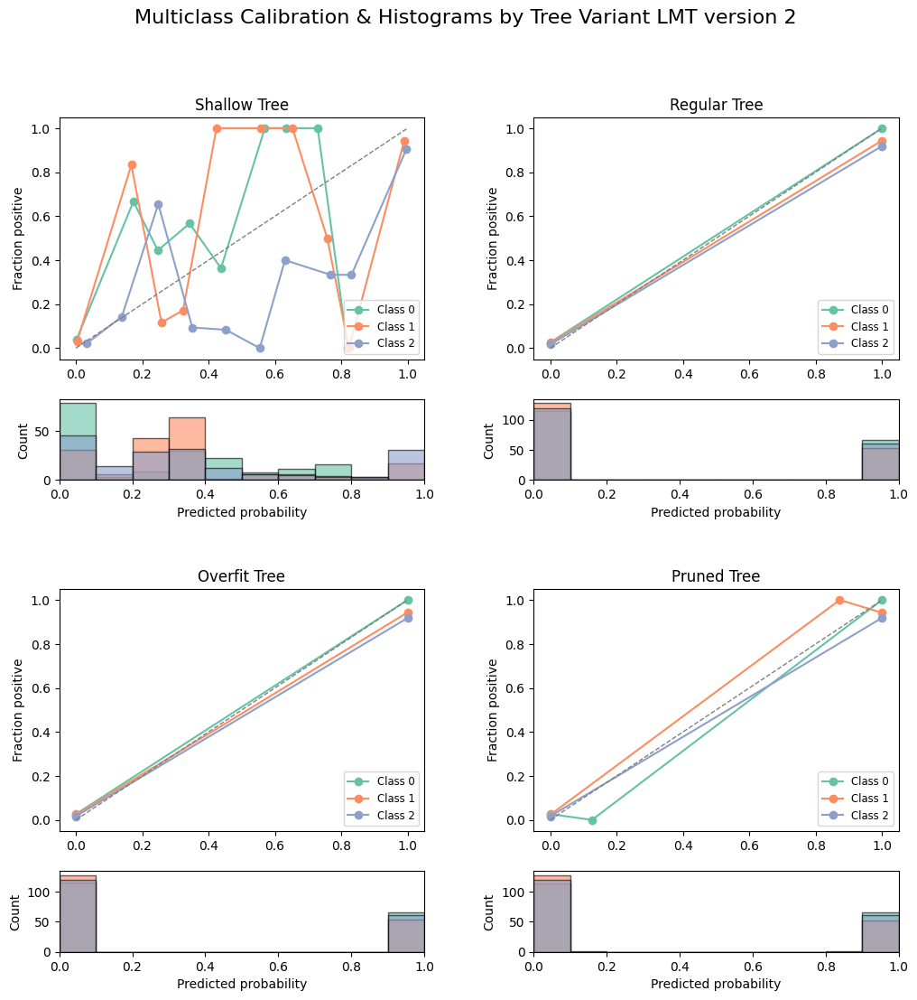

In [18]:
clfs2 = [
    (clf_shallow2, nodes_shallow2, "Shallow"),
    (clf_regular2, nodes_regular2, "Regular"),
    (clf_overfit2, nodes_overfit2,  "Overfit"),
    (clf_pruned2,  nodes_pruned2, "Pruned")
]

# get colors for the 3 classes
cmap   = plt.get_cmap("Set2")
colors = [cmap(i) for i in range(3)]

n_bins = 10

fig = plt.figure(figsize=(12,12))
outer = GridSpec(2, 2, wspace=0.3, hspace=0.3)

for idx, (clf, node_model, label) in enumerate(clfs2):
    # compute probabilities for this tree
    proba = lmt.predict_proba_lmt_multiclass(X_test, clf, node_model)

    # location in 2x2 grid
    row, col = divmod(idx, 2)
    cell = GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[row, col],
                                   height_ratios=[3,1], hspace=0.25)

    # --- Top: reliability diagram ---
    ax_cal = fig.add_subplot(cell[0])
    for k in range(3):
        y_bin  = (y_test == k).astype(int)
        p_k    = proba[:, k]
        frac, mean_pred = calibration_curve(y_bin, p_k, n_bins=n_bins)
        ax_cal.plot(mean_pred, frac, marker='o', color=colors[k],
                    label=f"Class {k}")
    ax_cal.plot([0,1],[0,1],"--", color="gray", lw=1)
    ax_cal.set_title(f"{label} Tree")
    ax_cal.set_ylabel("Fraction positive")
    ax_cal.legend(loc="lower right", fontsize="small")

    # --- Bottom: histograms of predicted probas ---
    ax_hist = fig.add_subplot(cell[1])
    for k in range(3):
        ax_hist.hist(proba[:, k],
                     bins=n_bins, range=(0,1),
                     color=colors[k], alpha=0.6, edgecolor="black")
    ax_hist.set_xlabel("Predicted probability")
    ax_hist.set_ylabel("Count")
    ax_hist.set_xlim(0,1)

# super‐title
fig.suptitle("Multiclass Calibration & Histograms by Tree Variant LMT version 2", fontsize=16)
plt.show()

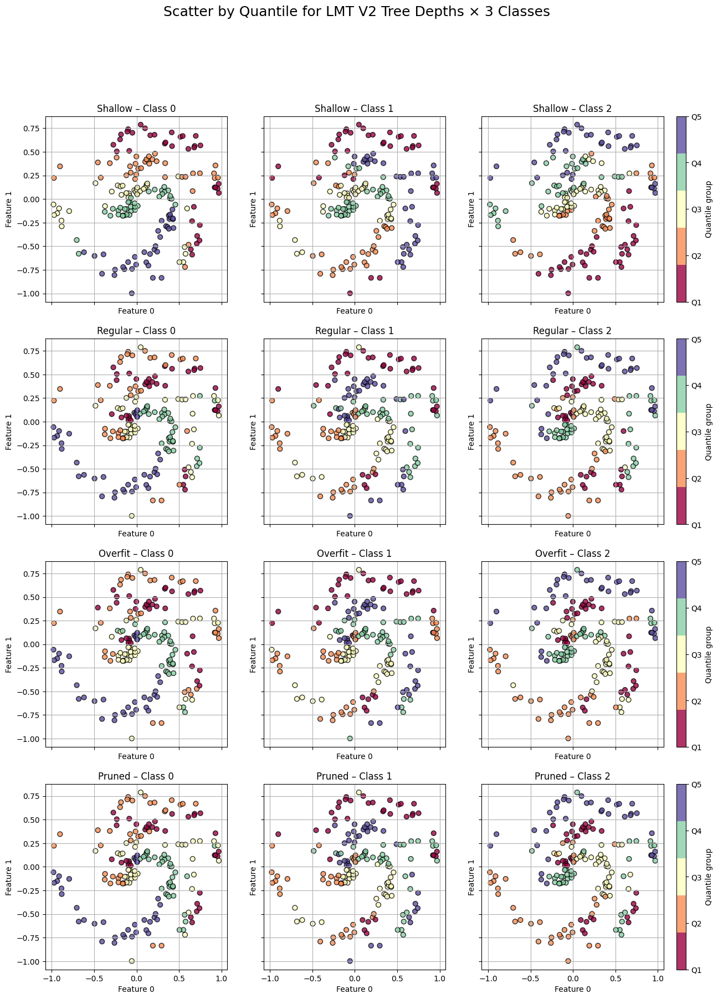

In [20]:
n_rows, n_cols = 4, 3
fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(15, 20),
    sharex=True, sharey=True
)

# 2) Loop over rows (tree depths) and columns (classes)
for i, (clf, node_model, depth_label) in enumerate(clfs2):
    probas = lmt.predict_proba_lmt_multiclass(X_test, clf, node_model)  # shape = (n_samples, 3)
    last_sc = None

    for j in range(n_cols):
        ax = axes[i, j]
        proba_j = probas[:, j]

        # draw the scatter and keep the PathCollection
        last_sc = calibration.plot_scatter_by_quantile(
            X_test,
            proba_j,
            n_quantiles=5,
            title=f"{depth_label} – Class {j}",
            ax=ax,
            cmap="Spectral"
        )

    # 3) one colorbar per row, spanning all three columns
    cbar = fig.colorbar(
        last_sc,
        ax=axes[i, :].tolist(),
        orientation="vertical",
        fraction=0.02,
        pad=0.02,
        ticks=range(5)
    )
    cbar.set_label("Quantile group")
    cbar.set_ticklabels([f"Q{k+1}" for k in range(5)])

# 4) Super‐title and layout
fig.suptitle("Scatter by Quantile for LMT V2 Tree Depths × 3 Classes", fontsize=18)
plt.show()